# 1. Importing

In [ ]:
!pip install PyWavelets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 37.2 MB/s eta 0:00:00


In [ ]:
#import mne
# Importing numpy
import numpy as np
# Importing Scipy
import scipy as sp
# Importing Pandas Library
import pandas as pd
# import glob function to scrap files path
from glob import glob
# import display() for better visualitions of DataFrames and arrays
from IPython.display import display
# import pyplot for plotting
import matplotlib.pyplot as plt
import math
from skimage.restoration import denoise_wavelet
from scipy.signal import savgol_filter
from scipy.signal import medfilt
import seaborn as sns
import pywt

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


,Condition,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,EEG.O1,EEG.O2,EEG.P8,EEG.T8,EEG.FC6,EEG.F4,EEG.F8,EEG.AF4
0,1,4335.641113,4308.717773,4341.538574,4333.077148,4253.205078,4247.820313,4247.051270,4222.563965,4205.256348,4211.410156,4524.615234,4497.307617,4374.102539,4511.153809
1,1,4342.307617,4308.717773,4348.077148,4336.922852,4250.512695,4250.384766,4247.051270,4227.692383,4204.358887,4223.333496,4557.179688,4509.487305,4421.922852,4512.436035
2,1,4338.461426,4309.743652,4344.230957,4330.512695,4254.102539,4246.922852,4246.025879,4226.538574,4198.974121,4212.820313,4538.205078,4500.512695,4407.307617,4502.179688
3,1,4335.256348,4312.948730,4342.948730,4329.102539,4262.948730,4245.512695,4246.538574,4230.641113,4207.948730,4217.436035,4497.563965,4490.897461,4398.333496,4503.333496
4,1,4333.974121,4312.692383,4344.615234,4336.922852,4265.512695,4248.205078,4248.717773,4236.922852,4219.102539,4234.230957,4504.102539,4494.615234,4426.922852,4507.692383


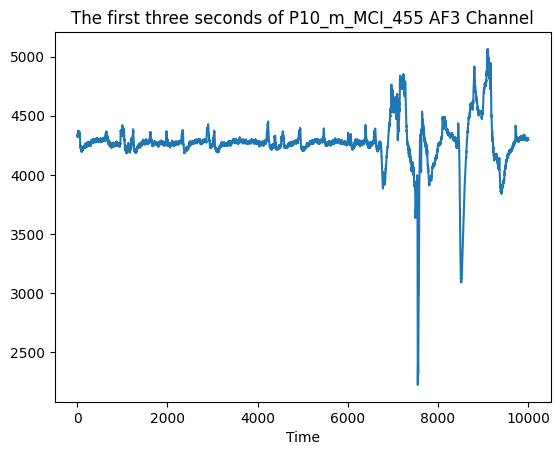

In [ ]:
d_frame=pd.read_csv('data/training/subject_1_455.csv',header=1)
#d_frame.drop(columns='TimeDate',inplace=True)          # converting the raw file to data frame
plt.plot(d_frame['EEG.AF3'][0:10000])           # visualizing the first 10000 values of channel ECG ECG
plt.xlabel('Time')
plt.title('The first three seconds of P10_m_MCI_455 AF3 Channel')
d_frame.head()

Text(0.5, 1.0, 'The Distribution of the EEG AF3 ')

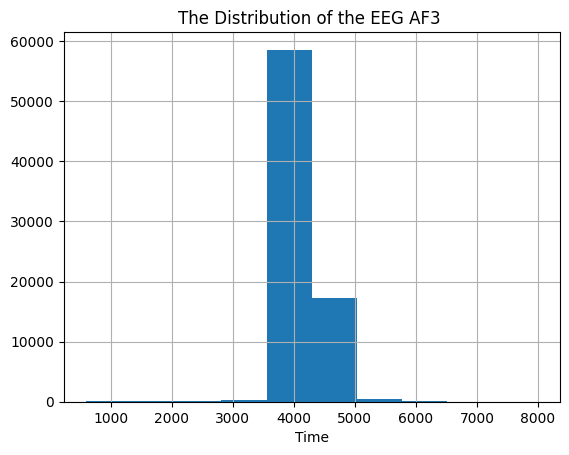

In [ ]:
d_frame['EEG.AF3'].hist()
plt.xlabel('Time')
plt.title('The Distribution of the EEG AF3 ')

In [ ]:
EEG_Raw_data_paths = sorted(glob("/data/training/EEG/*"))
HRV_Raw_data_paths = sorted(glob("/data/training/HRV/*"))

In [ ]:
len(EEG_Raw_data_paths)

24

In [ ]:
len(HRV_Raw_data_paths)

24

In [ ]:
def create_EEG_data_dict(Raw_data_paths):
    """
    This function creates a dictionary that contains patients as keys
    and the eeg data as values.
    INPUT -----> the sorted list of student' EEG files.
    OUTPUT ----> A python Dict that contains
    keys: Patients
    Values: Data
    """
    raw_dic={}
    for path_index in range(0,24):
        key= Raw_data_paths[path_index][-17:-4]     # to extract the subjectxx-x from the files
        data_frame=pd.read_csv(Raw_data_paths[path_index],header=1)
        data_frame.drop(columns='Condition',inplace=True)
        raw_dic[key]=data_frame
    return raw_dic
eeg_raw_dic=create_EEG_data_dict(EEG_Raw_data_paths)

In [ ]:
print(eeg_raw_dic)

{'subject_0_394':            EEG.AF3       EEG.F7       EEG.F3      EEG.FC5       EEG.T7  \
0      4344.230957  4366.282227  4326.922852  4357.563965  4425.512695   
1      4329.615234  4354.102539  4319.615234  4348.589844  4412.820313   
2      4344.102539  4369.358887  4330.769043  4365.000000  4436.538574   
3      4348.205078  4368.205078  4324.743652  4358.717773  4426.282227   
4      4338.077148  4352.307617  4317.948730  4343.974121  4399.871582   
...            ...          ...          ...          ...          ...   
69153  4345.256348  4334.102539  4324.102539  4328.077148  4338.077148   
69154  4334.487305  4333.077148  4317.948730  4323.333496  4333.589844   
69155  4328.717773  4325.384766  4311.794922  4319.102539  4327.948730   
69156  4335.384766  4321.153809  4315.512695  4320.641113  4328.589844   
69157  4346.538574  4337.948730  4329.487305  4335.641113  4353.846191   

            EEG.P7       EEG.O1       EEG.O2       EEG.P8       EEG.T8  \
0      3160.769287 

In [ ]:
def create_HRV_data_dict(Raw_data_paths):
    """
    This function creates a dictionary that contains patients as keys
    and the hrv data as values.
    INPUT -----> the sorted list of student' EEG files.
    OUTPUT ----> A python Dict that contains
    keys: Patients
    Values: Data
    """
    raw_dic={}
    for path_index in range(0,24):
        key= Raw_data_paths[path_index][-21:-8]     # to extract the subjectxx-x from the files
        data_frame=pd.read_csv(Raw_data_paths[path_index],header=0)
        data_frame.drop(columns='Condition',inplace=True)
        data_frame.drop(columns='Time',inplace=True)
        data_frame.drop(columns='Time of day',inplace=True)
        rr_intervals = []
        for index, row in data_frame.iterrows():
            rr = 60000/row[0]
            rr_intervals.append(rr)
        data_frame["RR"] = rr_intervals
        raw_dic[key]=data_frame
    return raw_dic
hrv_raw_dic=create_HRV_data_dict(HRV_Raw_data_paths)

<ipython-input-21-494dde4ee33c>:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  rr = 60000/row[0]
<ipython-input-21-494dde4ee33c>:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  rr = 60000/row[0]
<ipython-input-21-494dde4ee33c>:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  rr = 60000/row[0]
<ipython-input-21-494dde4ee33c>:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, int

In [ ]:
print(hrv_raw_dic)

{'subject_0_394':       HR [bpm]           RR
0           58  1034.482759
1           58  1034.482759
2           58  1034.482759
3           58  1034.482759
4           58  1034.482759
...        ...          ...
5806        76   789.473684
5807        76   789.473684
5808        76   789.473684
5809        76   789.473684
5810        76   789.473684

[5811 rows x 2 columns], 'subject_0_395':       HR [bpm]          RR
0           87  689.655172
1           87  689.655172
2           87  689.655172
3           87  689.655172
4           87  689.655172
...        ...         ...
5646        90  666.666667
5647        90  666.666667
5648        90  666.666667
5649        90  666.666667
5650        90  666.666667

[5651 rows x 2 columns], 'subject_0_396':       HR [bpm]          RR
0           74  810.810811
1           73  821.917808
2           73  821.917808
3           73  821.917808
4           73  821.917808
...        ...         ...
6216        72  833.333333
6217        72  833.

In [ ]:
# raw_dic is a dictionary contains 61 DF
print('raw_dic contains %d DataFrame' % len(eeg_raw_dic))

# print the first 3 rows of dataframe exp01_user01
eeg_raw_dic['subject_1_467']

raw_dic contains 24 DataFrame


,EEG.AF3,EEG.F7,EEG.F3,EEG.FC5,EEG.T7,EEG.P7,EEG.O1,EEG.O2,EEG.P8,EEG.T8,EEG.FC6,EEG.F4,EEG.F8,EEG.AF4
0,4035.769287,4082.051270,4071.025635,4052.051270,3947.051270,3885.641113,4040.641113,4088.076904,4354.358887,4120.128418,4074.615479,4183.205078,4143.461426,4170.128418
1,4039.230713,4092.307617,4067.435791,4023.589844,3924.358887,3936.153809,4036.153809,4061.666748,4311.282227,4078.333252,4057.435791,4168.846191,4142.948730,4155.769043
2,4022.051270,4081.538574,4052.692383,3996.153809,3902.307617,4032.307617,4028.846191,4043.205078,4282.948730,4026.666748,4044.487061,4153.974121,4136.666504,4166.153809
3,3999.102539,4065.000000,4044.871826,3999.615479,3892.948730,3987.435791,4023.461426,4070.641113,4280.256348,4067.307617,4043.461426,4146.666504,4144.102539,4175.641113
4,3989.358887,4055.256348,4036.410156,3998.974365,3881.025635,3902.435791,4019.871826,4087.051270,4263.717773,4128.717773,4029.487061,4136.410156,4159.615234,4169.487305
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69000,4189.230957,4194.487305,4211.025879,4191.538574,4176.666504,4206.538574,4187.307617,4207.948730,4177.307617,4211.794922,4203.974121,4323.077148,4173.717773,4178.846191
69001,4191.666504,4184.871582,4205.384766,4190.128418,4192.307617,4206.922852,4186.025879,4212.820313,4176.538574,4207.948730,4207.948730,4323.077148,4178.205078,4179.102539
69002,4203.205078,4187.948730,4207.563965,4196.666504,4185.897461,4204.487305,4187.563965,4215.769043,4193.589844,4207.692383,4208.205078,4340.512695,4182.051270,4181.666504
69003,4200.256348,4188.717773,4212.307617,4200.512695,4169.487305,4193.077148,4186.153809,4221.282227,4200.128418,4205.512695,4202.179688,4347.948730,4180.000000,4181.025879


In [ ]:
number_of_channels= eeg_raw_dic['subject_1_467'].shape[1]
number_of_channels

14

In [ ]:
names_of_channels=eeg_raw_dic['subject_1_467'].columns
names_of_channels

Index(['EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1',
       'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4'],
      dtype='object')

In [ ]:
# raw_dic is a dictionary contains 61 DF
print('raw_dic contains %d DataFrame' % len(hrv_raw_dic))

# print the first 3 rows of dataframe exp01_user01
hrv_raw_dic['subject_1_467']

raw_dic contains 24 DataFrame


,HR [bpm],RR
0,65.0,923.076923
1,65.0,923.076923
2,65.0,923.076923
3,65.0,923.076923
4,65.0,923.076923
...,...,...
5746,61.0,983.606557
5747,61.0,983.606557
5748,61.0,983.606557
5749,61.0,983.606557


In [ ]:
number_of_channels= hrv_raw_dic['subject_1_467'].shape[1]
number_of_channels

2

In [ ]:
names_of_channels=hrv_raw_dic['subject_1_467'].columns
names_of_channels

Index(['HR [bpm]', 'RR'], dtype='object')

#2. Signal Analysis

In [ ]:
import pandas as pd
import glob

def load_eeg_data(file_pattern):
    # Find all files that match the file pattern
    files = glob.glob(file_pattern)

    # Dictionaries to hold the EEG data for healthy and MCI patients
    eeg_healthy = {}
    eeg_mci = {}

    # Loop through the files and load data
    for file in files:
        # Read the CSV file, skipping the first row (header)
        data = pd.read_csv(file, header=1)  # Adjust if the header is not the first row
        if '_0_' in file:
            # The filename contains '_0_', indicating a healthy patient
            eeg_healthy[file] = data
        elif '_1_' in file:
            # The filename contains '_1_', indicating a MCI patient
            eeg_mci[file] = data

    return eeg_healthy, eeg_mci

eeg_healthy_data, eeg_mci_data = load_eeg_data('/data/training/EEG/*.csv')

In [ ]:
from scipy.signal import welch
from scipy.integrate import simpson

# Function to calculate the band power of a specific frequency band within EEG data
def bandpower(data, sf, band, window_sec=None, relative=False):
    """Compute the band power of the EEG."""
    band = np.asarray(band)
    low, high = band

    # Define the duration of the window to compute the PSD
    if window_sec is not None:
        nperseg = sf * window_sec
    else:
        nperseg = sf * 4  # Default is 4 seconds if not specified

    # Ensure the length of the data is at least equal to the window size
    if len(data) < nperseg:
        nperseg = len(data) // 2

    # Compute the PSD of the data using Welch's method
    freqs, psd = welch(data, sf, nperseg=nperseg)

    # Find the power of the signal in the band using the frequencies and PSD
    idx_band = np.logical_and(freqs >= low, freqs <= high)
    bp = simpson(psd[idx_band], dx=np.diff(freqs)[0])

    if relative:
        bp /= simpson(psd, dx=np.diff(freqs)[0])

    return bp

In [ ]:
# Function to load multiple EEG files into a list of dataframes
def load_eeg_data(file_paths):
    dataframes = []
    for file_path in file_paths:
        df = pd.read_csv(file_path, header=1)
        dataframes.append(df)
    return dataframes

# Load the data
healthy_dfs = load_eeg_data(eeg_healthy_data)
mci_dfs = load_eeg_data(eeg_mci_data)

In [ ]:
from scipy.signal import butter, lfilter

def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a

def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = lfilter(b, a, data, axis=0)  # Axis 0 should be the time dimension
    return y

# dfs is a list of DataFrames where each DataFrame
# corresponds to a single EEG recording session with time points as rows
def filter_dfs(dfs, lowcut, highcut, fs, order=5):
    filtered_dfs = []
    for df in dfs:
        # Apply the filter to each column/channel
        filtered_data = butter_bandpass_filter(df, lowcut, highcut, fs, order)
        filtered_dfs.append(pd.DataFrame(filtered_data, columns=df.columns))
    return filtered_dfs

lowcut = 1
highcut = 40
sf = 128

healthy_dfs_filtered = filter_dfs(healthy_dfs, lowcut, highcut, sf)
mci_dfs_filtered = filter_dfs(mci_dfs, lowcut, highcut, sf)

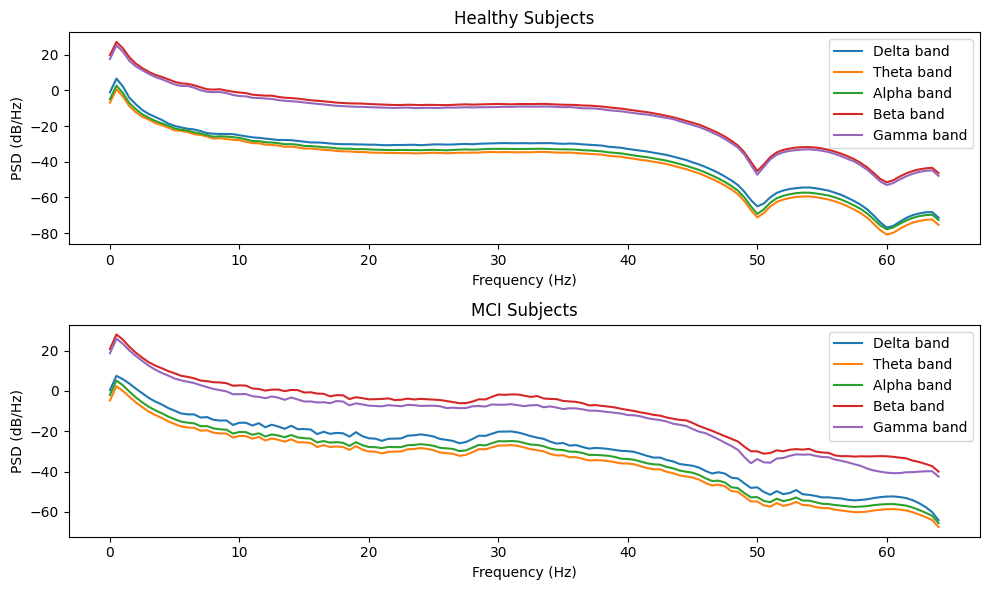

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import welch, filtfilt, butter
from scipy.signal import lfilter

def bandpass_filter(signal, low_freq, high_freq, fs, order=5):
    nyquist = 0.5 * fs
    low = low_freq / nyquist
    high = high_freq / nyquist
    b, a = butter(order, [low, high], btype='band')
    filtered_signal = lfilter(b, a, signal, axis=0)
    return filtered_signal

eeg_bands = {
    'Delta': (1, 4),
    'Theta': (4, 8),
    'Alpha': (8, 13),
    'Beta': (13, 30),
    'Gamma': (30, 45)
}

fs = 128  

# Initialize figure
fig, axes = plt.subplots(nrows=2, figsize=(10, 6))

# Function to plot the average PSD for a group of EEG data
def plot_average_psd(eeg_data_dict, ax, label, fs, eeg_bands):
    for band, (low_freq, high_freq) in eeg_bands.items():
        psd_averages = []
        for data in eeg_data_dict.values():
            # Filter the data
            filtered = bandpass_filter(data.values.T, low_freq, high_freq, fs)
            # Compute the PSD
            freqs, psd = welch(filtered, fs, nperseg=fs*2)
            # Average the PSD across channels
            psd_mean = np.mean(psd, axis=0)
            psd_averages.append(psd_mean)
        # Average the PSD over all files
        psd_final_mean = np.mean(psd_averages, axis=0)
        # Plot the average PSD
        ax.plot(freqs, 10 * np.log10(psd_final_mean), label=f'{band} band')

# Plot the data for healthy subjects
plot_average_psd(eeg_healthy_data, axes[0], 'Healthy', fs, eeg_bands)
axes[0].set_title('Healthy Subjects')
axes[0].set_ylabel('PSD (dB/Hz)')
axes[0].set_xlabel('Frequency (Hz)')
axes[0].legend(loc='upper right')

# Plot the data for MCI subjects
plot_average_psd(eeg_mci_data, axes[1], 'MCI', fs, eeg_bands)
axes[1].set_title('MCI Subjects')
axes[1].set_ylabel('PSD (dB/Hz)')
axes[1].set_xlabel('Frequency (Hz)')
axes[1].legend(loc='upper right')

# Adjust layout and show figure
plt.tight_layout()
plt.show()

In [ ]:
from scipy.stats import mannwhitneyu

# Function to perform statistical test for each band
def test_statistical_significance(bands, healthy_dfs_filtered, mci_dfs_filtered, sf):
    p_values = {}
    for band, freq_range in bands.items():
        healthy_band_powers = [bandpower(df.mean(axis=1).values, sf, freq_range, window_sec=4) for df in healthy_dfs]
        mci_band_powers = [bandpower(df.mean(axis=1).values, sf, freq_range, window_sec=4) for df in mci_dfs]
        # Perform Mann-Whitney U test
        stat, p = mannwhitneyu(healthy_band_powers, mci_band_powers)
        p_values[band] = p
    return p_values

# Compute p-values for each frequency band
p_values = test_statistical_significance(eeg_bands, healthy_dfs, mci_dfs, sf)

# Print out p-values
for band, p in p_values.items():
    print(f"{band} band p-value: {p:.5f}")

Delta band p-value: 0.72813
Theta band p-value: 0.81674
Alpha band p-value: 0.81674
Beta band p-value: 0.56234
Gamma band p-value: 0.56234


# 2. Signal Processing

Reference: https://www.ncbi.nlm.nih.gov/pmc/articles/PMC7278014/

The filters used are third-order:

* median filter (remove noise)
* notch filter (remove power line noise)

For denoising and smoothing:

* wavelet denoising
* Savitzky–Golay filter


In [ ]:
from scipy.signal import medfilt # import the median filter function
def median(signal):# input: numpy array 1D (one column)
    array=np.array(signal)
    #applying the median filter
    med_filtered=sp.signal.medfilt(array, kernel_size=3) # applying the median filter order3(kernel_size=3)
    return  med_filtered # return the med-filtered signal: numpy array 1D

In [ ]:
from scipy.signal import welch, filtfilt, butter
from scipy.signal import lfilter

fs = 128

#notch filter apllied at 50hz
def Implement_Notch_Filter(time, band, freq, ripple, order, filter_type, data):
    from scipy.signal import iirfilter
    fs   = 1/time
    nyq  = fs/2.0
    low  = freq - band/2.0
    high = freq + band/2.0
    low  = low/nyq
    high = high/nyq
    b, a = iirfilter(order, [low, high], rp=ripple, btype='bandstop',
                     analog=False, ftype=filter_type)
    filtered_data = lfilter(b, a, data)
    return filtered_data

def bandpass_filter(signal, low_freq, high_freq, fs, order=5):
    nyquist = 0.5 * fs
    low = low_freq / nyquist
    high = high_freq / nyquist
    b, a = butter(order, [low, high], btype='band')
    filtered_signal = lfilter(b, a, signal, axis=0)
    return filtered_signal

In [ ]:
def SignalProcessing(raw_dic):
    time_sig_dic = {}
    raw_dic_keys = sorted(raw_dic.keys())
    for key in raw_dic_keys:
        raw_df = raw_dic[key]
        time_sig_df = pd.DataFrame()
        for column in raw_df.columns:
            t_signal = np.array(raw_df[column])
            med_filtered = median(t_signal)

            # Apply bandpass filter for theta and alpha bands
            theta_filtered = bandpass_filter(med_filtered, 4, 8, fs, order=2)
            beta_filtered = bandpass_filter(med_filtered, 13, 30, fs, order=2)

            # Combine theta and alpha filtered signals
            combined_signal = np.concatenate((theta_filtered, beta_filtered))

            # Further processing (wavelet denoising, Savitzky-Golay filtering)
            wavelet_denoised = denoise_wavelet(combined_signal, method='BayesShrink', mode='hard', wavelet='sym9', wavelet_levels=5, rescale_sigma=True)
            clean_signals = savgol_filter(wavelet_denoised, 1111, 3, mode='wrap')

            time_sig_df[column] = clean_signals
        time_sig_dic[key] = time_sig_df
    return time_sig_dic

In [ ]:
time_sig_dic=SignalProcessing(eeg_raw_dic)

In [ ]:
time_list=[]
for i in range (0,23):
    time=(time_sig_dic[EEG_Raw_data_paths[i][-17:-4]].index.values[-1])
    time_list.append(time)
data=np.array(time_list)
eeg_time_length=pd.DataFrame(data=data,columns=['Signal length'])
#eeg_time_length

In [ ]:
time_list=[]
for i in range (0,23):
    time=(hrv_raw_dic[HRV_Raw_data_paths[i][-21:-8]].index.values[-1])
    time_list.append(time)
data=np.array(time_list)
hrv_time_length=pd.DataFrame(data=data,columns=['Signal length'])
#hrv_time_length

In [ ]:
# it add '0's to the left of the input until the new lenght is equal to 5
def normalize5(number):
    stre=str(number)
    if len(stre)<5:
        l=len(stre)
        for i in range(0,5-l):
            stre="0"+stre
    return stre

# it add '0's to the left of the input until the new lenght is equal to 2
def normalize2(number):
    stre=str(number)
    if len(stre)<2:
        stre="0"+stre
    return stre

# 3. Windowing

In [ ]:
def EEG_Windowing(time_sig_dic):
    """
    This Function is used to segment the data to small windows through
    looping over each dataframe's index and store each 30 secs of the data
    in a single window with a key that has this pattern
    the window size is calculated as follows:
    wind_size=(1/Fs)*required_window_time_length
    'Subject' + normalize2(int(subject_id))  +  '_' + str(state)
    INPUT ----> The denoised signal dictionary
    OUTPUT ---> A dictionary that contains the windows
    """
    window_dict={}
    columns=time_sig_dic['subject_1_467'].columns

    for subject_id , state, gender, age in zip([394,395,396,397,399,453,454,455,456,457,458,459,461,462,463,464,466,467,468,469,475,476,477,465],
                                  [0,0,0,1,0,1,0,1,1,1,1,1,1,0,0,1,0,1,0,1,0,0,1,1], [0,0,1,1,0,0,0,1,1,1,1,0,1,0,0,0,0,0,0,0,0,0,1,1] ,
                                  [73,73,70,66,64,71,66,81,80,71,74,73,79,79,66,68,80,66,84,79,70,65,71,74]):

        file_key= "subject_" + str(state) + "_" +str(subject_id)
        dic_update=eeg_raw_dic[file_key]
        for sig_time in range(0,len(eeg_time_length)):

            sig_time_length=(eeg_time_length['Signal length'][sig_time])
            window_ID=0
            for cursor in range(0,(sig_time_length-3839),1920):
                end_point=cursor+3840
                data=np.array(dic_update.iloc[cursor:end_point])
                window=pd.DataFrame(data=data,columns=columns)
                key='t_W'+normalize5(window_ID)+'_'+file_key
                window_dict[key]=window
                wind_dic=window_dict[key]
                window_ID=window_ID+1
    return window_dict

In [ ]:
eeg_window_dict=EEG_Windowing(eeg_raw_dic)

In [ ]:
eeg_new_frames = {k:v for (k,v) in eeg_window_dict.items() if not v.empty}

In [ ]:
len(eeg_new_frames)

935

In [ ]:
sorted(eeg_new_frames.keys())[0]

't_W00000_subject_0_394'

In [ ]:
def HRV_Windowing(time_sig_dic):


    """
    This Function is used to segment the data to small windows through
    looping over each dataframe's index and store each 30 secs of the data
    in a single window with a key that has this pattern
    the window size is calculated as follows:
    wind_size=(1/Fs)*required_window_time_length
    'Subject' + normalize2(int(subject_id))  +  '_' + str(state)
    INPUT ----> The denoised signal dictionary
    OUTPUT ---> A dictionary that contains the windows
    """
    window_dict={}
    columns=time_sig_dic['subject_1_467'].columns

    for subject_id , state, gender, age in zip([394,395,396,397,399,453,454,455,456,457,458,459,461,462,463,464,466,467,468,469,475,476,477,465],
                                  [0,0,0,1,0,1,0,1,1,1,1,1,1,0,0,1,0,1,0,1,0,0,1,1], [0,0,1,1,0,0,0,1,1,1,1,0,1,0,0,0,0,0,0,0,0,0,1,1] ,
                                  [73,73,70,66,64,71,66,81,80,71,74,73,79,79,66,68,80,66,84,79,70,65,71,74]):

        file_key= "subject_" + str(state) + "_" +str(subject_id)
        dic_update=hrv_raw_dic[file_key]
        for sig_time in range(0,len(hrv_time_length)):

            sig_time_length=(hrv_time_length['Signal length'][sig_time])
            window_ID=0
            for cursor in range(0,(sig_time_length-299),150):
                end_point=cursor+300
                data=np.array(dic_update.iloc[cursor:end_point])
                window=pd.DataFrame(data=data,columns=columns)
                key='t_W'+normalize5(window_ID)+'_'+file_key
                window_dict[key]=window
                wind_dic=window_dict[key]
                window_ID=window_ID+1
    return window_dict

In [ ]:
hrv_window_dict=HRV_Windowing(hrv_raw_dic)

In [ ]:
hrv_new_frames = {k:v for (k,v) in hrv_window_dict.items() if not v.empty}

In [ ]:
len(hrv_new_frames)

945

In [ ]:
hrv_new_frames

{'t_W00000_subject_0_394':      HR [bpm]           RR
 0        58.0  1034.482759
 1        58.0  1034.482759
 2        58.0  1034.482759
 3        58.0  1034.482759
 4        58.0  1034.482759
 ..        ...          ...
 295      57.0  1052.631579
 296      57.0  1052.631579
 297      57.0  1052.631579
 298      57.0  1052.631579
 299      57.0  1052.631579
 
 [300 rows x 2 columns],
 't_W00001_subject_0_394':      HR [bpm]           RR
 0        59.0  1016.949153
 1        59.0  1016.949153
 2        59.0  1016.949153
 3        59.0  1016.949153
 4        59.0  1016.949153
 ..        ...          ...
 295      58.0  1034.482759
 296      58.0  1034.482759
 297      58.0  1034.482759
 298      58.0  1034.482759
 299      58.0  1034.482759
 
 [300 rows x 2 columns],
 't_W00002_subject_0_394':      HR [bpm]           RR
 0        57.0  1052.631579
 1        58.0  1034.482759
 2        58.0  1034.482759
 3        58.0  1034.482759
 4        58.0  1034.482759
 ..        ...          ...


In [ ]:
sorted(hrv_new_frames.keys())[0]

't_W00000_subject_0_394'

In [ ]:
hrv_window_dict

{'t_W00000_subject_0_394':      HR [bpm]           RR
 0        58.0  1034.482759
 1        58.0  1034.482759
 2        58.0  1034.482759
 3        58.0  1034.482759
 4        58.0  1034.482759
 ..        ...          ...
 295      57.0  1052.631579
 296      57.0  1052.631579
 297      57.0  1052.631579
 298      57.0  1052.631579
 299      57.0  1052.631579
 
 [300 rows x 2 columns],
 't_W00001_subject_0_394':      HR [bpm]           RR
 0        59.0  1016.949153
 1        59.0  1016.949153
 2        59.0  1016.949153
 3        59.0  1016.949153
 4        59.0  1016.949153
 ..        ...          ...
 295      58.0  1034.482759
 296      58.0  1034.482759
 297      58.0  1034.482759
 298      58.0  1034.482759
 299      58.0  1034.482759
 
 [300 rows x 2 columns],
 't_W00002_subject_0_394':      HR [bpm]           RR
 0        57.0  1052.631579
 1        58.0  1034.482759
 2        58.0  1034.482759
 3        58.0  1034.482759
 4        58.0  1034.482759
 ..        ...          ...


# 4. Empirical Mode Decomposition

In [ ]:
!pip install EMD-signal

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.1/82.1 kB 7.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.4/119.4 kB 11.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 144.3/144.3 kB 13.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.8/56.8 kB 4.9 MB/s eta 0:00:00


In [ ]:
from PyEMD import EMD
import numpy as np
import pandas as pd
import itertools

##################### Empirical Mode Decomposition #################
# Inputs: time signal 1D array
# Output: Intrinsic Mode Functions (IMFs) 2D array where each row is an IMF

def empirical_mode_decomposition(t_signal):
    # Initialize the EMD object
    emd = EMD()
    # Decompose the signal into IMFs
    imfs = emd(t_signal)
    # Return the IMFs
    return imfs

##################### EMD for data frames #################

from PyEMD import EEMD

def emd_for_data_frames(t_window):
    columns = t_window.columns.tolist()
    imfs_dict = {}

    # Initialize EEMD with fewer trials and parallel processing
    eemd = EEMD(trials=1, parallel=True)

    # Iterate over each column
    for column in columns:
        print(column)
        # Perform EEMD decomposition
        imfs = eemd.eemd(t_window[column].values)
        n_imfs = imfs.shape[0]

        # Store the IMFs in the dictionary
        for i in range(n_imfs):
            imfs_dict[f'{column}_IMF{i+1}'] = imfs[i]
            print(imfs_dict[f'{column}_IMF{i+1}'])

    # Convert the dictionary to a DataFrame
    imfs_df = pd.DataFrame(imfs_dict)
    return imfs_df

t_window_dict = {'t' + key[1:]: t_w1_df for key, t_w1_df in eeg_new_frames.items()}

imf_window_dict = {key: emd_for_data_frames(t_w1_df) for key, t_w1_df in t_window_dict.items() if not t_w1_df.empty}

Streaming output truncated to the last 5000 lines.
[-25.88375051 -25.88461893 -25.88520832 ... -75.10509332 -74.6642945
 -74.2249402 ]
[4288.57236423 4288.56668782 4288.56102604 ... 4440.78279435 4440.76149995
 4440.74014892]
EEG.FC6
[ 80.84082187 -83.61198099  -8.38669981 ... -55.5802996   48.39291756
  27.58503133]
[ 11.63595251 -22.2627365  -50.57719736 ... -42.92355273  20.46060271
  85.03632186]
[ 5.52540479 -2.44752229 -5.53676516 ... -1.48075694  8.52496638
 15.39204681]
[19.49879747 21.52344865 24.22387415 ...  9.98836289  7.24460094
  3.96251154]
[-100.90758803 -103.96741502 -106.63540059 ... -396.4066386  -393.452001
 -389.88623314]
[ 37.89072887  38.548471    39.33510548 ... -49.77998739 -49.5290974
 -49.16950304]
[50.64391604 50.35524729 50.03865533 ... -4.95350316 -4.85342283
 -4.74096651]
[ 13.24827591  13.11413249  12.97581613 ... 198.29637714 198.00433275
 197.71112671]
[  31.41398659   31.24773642   31.08141294 ... -261.06524438 -260.9374564
 -260.80652517]
[4290.91033

In [ ]:
imf_window_dict

{'t_W00000_subject_0_394':       EEG.AF3_IMF1  EEG.AF3_IMF2  EEG.AF3_IMF3  EEG.AF3_IMF4  EEG.AF3_IMF5  \
 0        -1.364933     -3.193374     -2.859928     -4.408447    -12.726602   
 1       -12.131087     -8.113377     -3.240495     -4.423859    -12.913472   
 2        11.719523     -0.399161     -2.898143     -4.327228    -13.095496   
 3       -10.494768      7.676572     -2.214388     -4.125807    -13.272249   
 4         8.637555      4.707311     -1.600352     -3.829914    -13.443202   
 ...            ...           ...           ...           ...           ...   
 3835      3.973734     19.825553      3.751172    -13.632314      0.018499   
 3836      6.080272     21.344542      2.402499    -13.315672     -0.011852   
 3837     -6.698218     11.270521      1.222069    -12.876403     -0.062399   
 3838      6.923182     -1.425463      0.224010    -12.335946     -0.133209   
 3839     -3.058710     -7.196132     -0.592708    -11.715303     -0.224348   
 
       EEG.AF3_IMF6  EEG

In [ ]:
import pickle

# Save the dictionary to a file
with open('data/training/imfs_dict_3.pkl', 'wb') as file:
    pickle.dump(imf_window_dict, file)

In [ ]:
import pickle

# Load the dictionary from the file
with open('data/training/imfs_dict_3.pkl', 'rb') as file:
    loaded_imfs_dict = pickle.load(file)

In [ ]:
loaded_imfs_dict

{'t_W00000_subject_0_394':       EEG.AF3_IMF1  EEG.AF3_IMF2  EEG.AF3_IMF3  EEG.AF3_IMF4  EEG.AF3_IMF5  \
 0        -1.364933     -3.193374     -2.859928     -4.408447    -12.726602   
 1       -12.131087     -8.113377     -3.240495     -4.423859    -12.913472   
 2        11.719523     -0.399161     -2.898143     -4.327228    -13.095496   
 3       -10.494768      7.676572     -2.214388     -4.125807    -13.272249   
 4         8.637555      4.707311     -1.600352     -3.829914    -13.443202   
 ...            ...           ...           ...           ...           ...   
 3835      3.973734     19.825553      3.751172    -13.632314      0.018499   
 3836      6.080272     21.344542      2.402499    -13.315672     -0.011852   
 3837     -6.698218     11.270521      1.222069    -12.876403     -0.062399   
 3838      6.923182     -1.425463      0.224010    -12.335946     -0.133209   
 3839     -3.058710     -7.196132     -0.592708    -11.715303     -0.224348   
 
       EEG.AF3_IMF6  EEG

# 5. Feature Extraction

In [ ]:
# mean
def mean_axial(df):
    array=np.array(df) # convert dataframe into 2D numpy array for efficiency
    mean_vector = array.mean(axis=0) # calculate the mean value of each column
    return mean_vector # return mean vetor

# std
def std_axial(df):
    array=np.array(df) # convert dataframe into 2D numpy array for efficiency
    std_vector =array.std(axis=0) # calculate the standard deviation value of each column
    return std_vector

# mad
from statsmodels.robust import mad as median_deviation # import the median deviation function
def mad_axial(df):
    array=np.array(df) # convert dataframe into 2D numpy array for efficiency
    mad_vector = median_deviation(array,axis=0) # calculate the median deviation value of each column
    return mad_vector

# max
def max_axial(df):
    array=np.array(df) # convert dataframe into 2D numpy array for efficiency
    max_vector=array.max(axis=0)# calculate the max value of each column
    return max_vector

# min
def min_axial(df):
    array=np.array(df) # convert dataframe into 2D numpy array for efficiency
    min_vector=array.min(axis=0)# calculate the min value of each column
    return min_vector

# IQR
from scipy.stats import iqr as IQR # import interquartile range function (Q3(column)-Q1(column))
def IQR_axial(df):
    array=np.array(df) # convert dataframe into 2D numpy array for efficiency
    IQR_vector=np.apply_along_axis(IQR,0,array)# calculate the inter quartile range value of each column
    return IQR_vector

# Entropy
from scipy.stats import entropy # import the entropy function
def entropy_axial(df):
    array=np.array(df) # convert dataframe into 2D numpy array for efficiency
    entropy_vector=np.apply_along_axis(entropy,0,abs(array))# calculate the entropy value of each column
    return entropy_vector

def rmssd(df):
    array=np.array(df) # convert dataframe into 2D numpy array for efficiency
    rmssd = np.sqrt(np.mean(df)**2)
    return rmssd

In [ ]:
imf_counts = {}
for key, df in loaded_imfs_dict.items():
    imf_count = {}
    for col in df.columns:
        if col.startswith('EEG.'):
            channel, imf = col.split('_')[0], col.split('_')[1]
            if channel not in imf_count:
                imf_count[channel] = set()
            imf_count[channel].add(imf)
    imf_counts[key] = {channel: len(imfs) for channel, imfs in imf_count.items()}

# Print the number of IMFs for each channel in each key
for key, counts in imf_counts.items():
    print(f"{key}: {counts}")

t_W00000_subject_0_394: {'EEG.AF3': 11, 'EEG.F7': 9, 'EEG.F3': 10, 'EEG.FC5': 10, 'EEG.T7': 9, 'EEG.P7': 10, 'EEG.O1': 10, 'EEG.O2': 11, 'EEG.P8': 10, 'EEG.T8': 10, 'EEG.FC6': 10, 'EEG.F4': 11, 'EEG.F8': 11, 'EEG.AF4': 10}
t_W00001_subject_0_394: {'EEG.AF3': 10, 'EEG.F7': 10, 'EEG.F3': 10, 'EEG.FC5': 9, 'EEG.T7': 10, 'EEG.P7': 10, 'EEG.O1': 9, 'EEG.O2': 10, 'EEG.P8': 9, 'EEG.T8': 10, 'EEG.FC6': 10, 'EEG.F4': 10, 'EEG.F8': 11, 'EEG.AF4': 10}
t_W00002_subject_0_394: {'EEG.AF3': 10, 'EEG.F7': 10, 'EEG.F3': 10, 'EEG.FC5': 10, 'EEG.T7': 10, 'EEG.P7': 10, 'EEG.O1': 10, 'EEG.O2': 10, 'EEG.P8': 10, 'EEG.T8': 10, 'EEG.FC6': 9, 'EEG.F4': 10, 'EEG.F8': 10, 'EEG.AF4': 10}
t_W00003_subject_0_394: {'EEG.AF3': 11, 'EEG.F7': 11, 'EEG.F3': 10, 'EEG.FC5': 10, 'EEG.T7': 10, 'EEG.P7': 10, 'EEG.O1': 10, 'EEG.O2': 10, 'EEG.P8': 11, 'EEG.T8': 11, 'EEG.FC6': 10, 'EEG.F4': 10, 'EEG.F8': 11, 'EEG.AF4': 10}
t_W00004_subject_0_394: {'EEG.AF3': 10, 'EEG.F7': 10, 'EEG.F3': 10, 'EEG.FC5': 10, 'EEG.T7': 10, 'EEG.P7':

In [ ]:
import dask.dataframe as dd
import pandas as pd

def filter_and_truncate_imfs_with_dask(loaded_imfs_dict, min_imfs=8, max_imfs=8):
    filtered_dict = {}
    for key, df in loaded_imfs_dict.items():
        ddf = dd.from_pandas(df, npartitions=10)  
        channel_imf_counts = {channel: 0 for channel in set(col.split('_')[0] for col in df.columns if col.startswith('EEG.'))}

        for col in ddf.columns:
            if col.startswith('EEG.'):
                channel, _ = col.split('_')[0:2]
                channel_imf_counts[channel] += 1

        if all(count >= min_imfs for count in channel_imf_counts.values()):
            truncated_df = pd.DataFrame()  # Initialize an empty Pandas DataFrame
            for channel in channel_imf_counts.keys():
                channel_imfs = [col for col in ddf.columns if col.startswith(f"{channel}_IMF")]
                truncated_df = pd.concat([truncated_df, df[channel_imfs[:max_imfs]]], axis=1)
            filtered_dict[key] = truncated_df  # No need to convert back to Pandas DataFrame

    return filtered_dict

filtered_imfs_dict = filter_and_truncate_imfs_with_dask(loaded_imfs_dict, min_imfs=7, max_imfs=7)
len(filtered_imfs_dict)

912

In [ ]:
filtered_imfs_dict

{'t_W00000_subject_0_394':       EEG.FC6_IMF1  EEG.FC6_IMF2  EEG.FC6_IMF3  EEG.FC6_IMF4  EEG.FC6_IMF5  \
 0         3.273190     -3.652582      1.038593     -1.456667     -1.668778   
 1       -17.438319     -5.388742      1.953164     -1.570450     -1.694472   
 2         0.211483     -6.053664      2.672421     -1.624681     -1.720083   
 3        15.396716     -7.131782      3.108335     -1.614144     -1.745637   
 4       -13.016548     -8.817761      3.172878     -1.533786     -1.770993   
 ...            ...           ...           ...           ...           ...   
 3835      6.935091      6.394724      0.862505      1.465179     -1.484388   
 3836      6.408542      9.913161      0.430820      0.775502     -2.222289   
 3837     -7.417055      0.747722     -0.456140     -0.141754     -2.878234   
 3838      7.430936    -11.366181     -1.170684     -1.109372     -3.418324   
 3839      1.276857    -11.087077     -1.092853     -1.963387     -3.808664   
 
       EEG.FC6_IMF6  EEG

In [ ]:
imf_counts = {}
for key, df in filtered_imfs_dict.items():
    for col in df.columns:
        if col.startswith('EEG.'):
            channel, imf = col.split('_')[0], col.split('_')[1]
            if channel not in imf_counts:
                imf_counts[channel] = set()
            imf_counts[channel].add(imf)

In [ ]:
# Energy calculation for each IMF component of each EEG channel
def t_energy_axial(df):
    energy_vector = (df**2).sum(axis=0) / len(df)
    return energy_vector

# Time Features Pipeline adapted for IMF components
def t_axial_features_generation(t_window, expected_imfs=8):
    t_axial_features = []
    channels = [col.split('_')[0] for col in t_window.columns if col.startswith('EEG.')]
    unique_channels = set(channels)

    for channel in unique_channels:
        for i in range(1, expected_imfs + 1):
            imf_column = f'{channel}_IMF{i}'
            if imf_column in t_window.columns:
                data = t_window[imf_column]
            else:
                data = pd.Series([0] * len(t_window))  # Pad with zeros if the IMF is missing

            mean_value = data.mean()
            std_value = data.std()
            max_value = data.max()
            min_value = data.min()
            energy_value = (data**2).sum() / len(data)
            t_axial_features.extend([mean_value, std_value, max_value, min_value, energy_value])

    return t_axial_features

# Generating feature names for the dataset
def time_features_names(num_imfs_per_channel=8):
    feature_names = []
    channels = ['EEG.AF3', 'EEG.F7', 'EEG.F3', 'EEG.FC5', 'EEG.T7', 'EEG.P7', 'EEG.O1', 'EEG.O2', 'EEG.P8', 'EEG.T8', 'EEG.FC6', 'EEG.F4', 'EEG.F8', 'EEG.AF4']
    for channel in channels:
        for imf_num in range(1, num_imfs_per_channel + 1):
            imf = f"IMF{imf_num}"
            for feature in ['mean', 'std', 'max', 'min', 'energy']:
                feature_names.append(f"{channel}_{imf}_{feature}")
    return feature_names

feature_names = time_features_names(num_imfs_per_channel=8)

print(feature_names)

time_columns = time_features_names(num_imfs_per_channel=8) + ['HRV', 'Max HRV', 'Min HRV', 'RR', 'Min RR', 'Max RR', 'SDRR', 'RMSSD', 'state', 'subject']

['EEG.AF3_IMF1_mean', 'EEG.AF3_IMF1_std', 'EEG.AF3_IMF1_max', 'EEG.AF3_IMF1_min', 'EEG.AF3_IMF1_energy', 'EEG.AF3_IMF2_mean', 'EEG.AF3_IMF2_std', 'EEG.AF3_IMF2_max', 'EEG.AF3_IMF2_min', 'EEG.AF3_IMF2_energy', 'EEG.AF3_IMF3_mean', 'EEG.AF3_IMF3_std', 'EEG.AF3_IMF3_max', 'EEG.AF3_IMF3_min', 'EEG.AF3_IMF3_energy', 'EEG.AF3_IMF4_mean', 'EEG.AF3_IMF4_std', 'EEG.AF3_IMF4_max', 'EEG.AF3_IMF4_min', 'EEG.AF3_IMF4_energy', 'EEG.AF3_IMF5_mean', 'EEG.AF3_IMF5_std', 'EEG.AF3_IMF5_max', 'EEG.AF3_IMF5_min', 'EEG.AF3_IMF5_energy', 'EEG.AF3_IMF6_mean', 'EEG.AF3_IMF6_std', 'EEG.AF3_IMF6_max', 'EEG.AF3_IMF6_min', 'EEG.AF3_IMF6_energy', 'EEG.AF3_IMF7_mean', 'EEG.AF3_IMF7_std', 'EEG.AF3_IMF7_max', 'EEG.AF3_IMF7_min', 'EEG.AF3_IMF7_energy', 'EEG.AF3_IMF8_mean', 'EEG.AF3_IMF8_std', 'EEG.AF3_IMF8_max', 'EEG.AF3_IMF8_min', 'EEG.AF3_IMF8_energy', 'EEG.F7_IMF1_mean', 'EEG.F7_IMF1_std', 'EEG.F7_IMF1_max', 'EEG.F7_IMF1_min', 'EEG.F7_IMF1_energy', 'EEG.F7_IMF2_mean', 'EEG.F7_IMF2_std', 'EEG.F7_IMF2_max', 'EEG.F7_IM

In [ ]:
def Dataset_Generation_PipeLine(t_dic, hrv_dic):
    final_Dataset = pd.DataFrame(columns=time_columns)
    for key, t_window in t_dic.items():
        if key in hrv_dic:
            h_window = hrv_dic[key]
            window_user_id = int(key[-3:])
            window_activity_id = int(key[-5])
            time_features = t_axial_features_generation(t_window)
            row = time_features + [
                round(mean_axial(h_window['HR [bpm]'])),
                max_axial(h_window['HR [bpm]']),
                min_axial(h_window['HR [bpm]']),
                mean_axial(h_window['RR']),
                max_axial(h_window['RR']),
                min_axial(h_window['RR']),
                mad_axial(h_window['RR']),
                rmssd(h_window['RR']),
            ] + [int(window_activity_id), int(window_user_id)]
            if len(row) != len(time_columns):
                print(f"Mismatch in number of columns for key {key}: expected {len(time_columns)}, got {len(row)}")
                continue
            final_Dataset.loc[len(final_Dataset)] = row
    return final_Dataset

In [ ]:
Dataset = Dataset_Generation_PipeLine(filtered_imfs_dict,hrv_new_frames)

In [ ]:
display(Dataset.head(10)) # the first ten rows

,EEG.AF3_IMF1_mean,EEG.AF3_IMF1_std,EEG.AF3_IMF1_max,EEG.AF3_IMF1_min,EEG.AF3_IMF1_energy,EEG.AF3_IMF2_mean,EEG.AF3_IMF2_std,EEG.AF3_IMF2_max,EEG.AF3_IMF2_min,EEG.AF3_IMF2_energy,...,HRV,Max HRV,Min HRV,RR,Min RR,Max RR,SDRR,RMSSD,state,subject
0,-0.005968,7.241577,23.122622,-21.971575,52.426821,0.007181,4.380550,13.952734,-13.715078,19.184277,...,58.0,59.0,56.0,1038.823242,1071.428571,1016.949153,25.995363,1038.823242,0.0,394.0
1,0.005287,7.703453,24.737843,-22.804938,59.327769,-0.006390,4.290195,15.442496,-15.335184,18.401019,...,59.0,60.0,56.0,1024.710154,1071.428571,1000.000000,25.128851,1024.710154,0.0,394.0
2,-0.086863,7.801947,25.473022,-22.389945,60.862067,0.059881,4.494462,15.721942,-14.337259,20.198516,...,59.0,61.0,57.0,1021.505285,1052.631579,983.606557,25.562107,1021.505285,0.0,394.0
3,-0.042285,7.877536,25.764130,-27.234023,62.041206,-0.035814,4.518983,17.372089,-16.888844,20.417175,...,61.0,67.0,57.0,980.175686,1052.631579,895.522388,75.429169,980.175686,0.0,394.0
4,0.009320,8.161454,27.661473,-26.272359,66.592076,0.024609,5.105083,18.768022,-17.844488,26.055687,...,63.0,67.0,60.0,952.067344,1000.000000,895.522388,22.774228,952.067344,0.0,394.0
5,0.014959,8.499180,28.207398,-26.805726,72.217479,-0.011427,5.083937,16.648297,-18.378989,25.839813,...,61.0,63.0,60.0,978.318350,1000.000000,952.380952,23.520924,978.318350,0.0,394.0
6,-0.047270,7.302708,20.640000,-19.912021,53.317890,-0.005157,4.253153,14.393630,-17.991277,18.084624,...,61.0,62.0,60.0,984.241142,1000.000000,967.741935,0.000000,984.241142,0.0,394.0
7,-0.029449,7.465491,20.807045,-21.094977,55.719909,0.068498,4.742602,17.298005,-16.698650,22.491106,...,63.0,66.0,60.0,959.670448,1000.000000,909.090909,23.520924,959.670448,0.0,394.0
8,0.071702,7.732487,27.508087,-26.327882,59.780919,-0.040882,4.741103,16.266062,-15.324642,22.473871,...,66.0,69.0,61.0,910.804637,983.606557,869.565217,39.641771,910.804637,0.0,394.0
9,0.192784,21.743282,66.367413,-71.470269,472.684361,0.016965,13.180238,45.921007,-43.311986,173.673710,...,67.0,69.0,64.0,896.347522,937.500000,869.565217,19.525051,896.347522,0.0,394.0


In [ ]:
Dataset.to_csv('/data/training/eeg_hrv_dataset.csv', index=False)

# 6. Feature Selection

In [ ]:
from sklearn.preprocessing import LabelEncoder, StandardScaler
import pandas as pd

Dataset = pd.read_csv('data/training/eeg_hrv_dataset.csv')

X = Dataset.drop(['state','subject'], axis = 1)
Y = Dataset['state']
X = pd.get_dummies(X, prefix_sep='_')

In [ ]:
X

,EEG.AF3_IMF1_mean,EEG.AF3_IMF1_std,EEG.AF3_IMF1_max,EEG.AF3_IMF1_min,EEG.AF3_IMF1_energy,EEG.AF3_IMF2_mean,EEG.AF3_IMF2_std,EEG.AF3_IMF2_max,EEG.AF3_IMF2_min,EEG.AF3_IMF2_energy,...,EEG.AF4_IMF8_min,EEG.AF4_IMF8_energy,HRV,Max HRV,Min HRV,RR,Min RR,Max RR,SDRR,RMSSD
0,-0.005968,7.241577,23.122622,-21.971575,52.426821,0.007181,4.380550,13.952734,-13.715078,19.184277,...,0.0,0.0,58.0,59.0,56.0,1038.823242,1071.428571,1016.949153,25.995363,1038.823242
1,0.005287,7.703453,24.737843,-22.804938,59.327769,-0.006390,4.290195,15.442496,-15.335184,18.401019,...,0.0,0.0,59.0,60.0,56.0,1024.710154,1071.428571,1000.000000,25.128851,1024.710154
2,-0.086863,7.801947,25.473022,-22.389945,60.862067,0.059881,4.494462,15.721942,-14.337259,20.198516,...,0.0,0.0,59.0,61.0,57.0,1021.505285,1052.631579,983.606557,25.562107,1021.505285
3,-0.042285,7.877536,25.764130,-27.234023,62.041206,-0.035814,4.518983,17.372089,-16.888844,20.417175,...,0.0,0.0,61.0,67.0,57.0,980.175686,1052.631579,895.522388,75.429169,980.175686
4,0.009320,8.161454,27.661473,-26.272359,66.592076,0.024609,5.105083,18.768022,-17.844488,26.055687,...,0.0,0.0,63.0,67.0,60.0,952.067344,1000.000000,895.522388,22.774228,952.067344
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
896,-0.223646,19.103871,62.497726,-63.728426,364.912871,0.087479,11.335528,44.124337,-46.067910,128.468388,...,0.0,0.0,67.0,68.0,66.0,894.886530,909.090909,882.352941,0.000000,894.886530
897,-0.075439,18.914936,49.994573,-51.549872,357.687322,-0.002040,11.252118,43.384006,-40.951574,126.577183,...,0.0,0.0,67.0,69.0,67.0,889.482256,895.522388,869.565217,0.000000,889.482256
898,0.105656,12.567755,31.112900,-31.014777,157.918491,0.022926,8.650390,29.004890,-28.033712,74.810280,...,0.0,0.0,68.0,69.0,67.0,878.818185,895.522388,869.565217,18.959108,878.818185
899,0.302471,26.799306,75.679923,-78.434732,718.107252,-0.010282,17.341998,55.415592,-51.044874,300.666687,...,0.0,0.0,68.0,69.0,66.0,884.182552,909.090909,869.565217,18.959108,884.182552


In [ ]:
Y

,state
0,0.0
1,0.0
2,0.0
3,0.0
4,0.0
...,...
896,1.0
897,1.0
898,1.0
899,1.0


In [ ]:
Y = LabelEncoder().fit_transform(Y)
X = StandardScaler().fit_transform(X)

In [ ]:
from sklearn.model_selection import train_test_split

# Split into training and test sets
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)

In [ ]:
# Further split the training set into training and validation sets
X_train, X_val, Y_train, Y_val = train_test_split(X_train, Y_train, test_size=0.25, random_state=42)

In [ ]:
from sklearn.feature_selection import RFECV
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold

# X_train and Y_train are already defined as feature set and labels
estimator = RandomForestClassifier(n_estimators=100, random_state=42)
cv = StratifiedKFold(5)
selector = RFECV(estimator, step=1, cv=cv, scoring='accuracy')
selector = selector.fit(X_train, Y_train)

optimal_feature_count = selector.n_features_
selected_features_mask = selector.support_
selected_features_indices = np.where(selected_features_mask)[0]

print(f'Optimal number of features: {optimal_feature_count}')
print(f'Selected features indices: {selected_features_indices}')

Optimal number of features: 550
Selected features indices: [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  37
  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57
  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75
  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93
  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108 109 110 111
 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128 129
 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145 146 147
 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165
 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180 181 182 183
 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198 199 200 201
 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216 217 218 219
 220 221 222 223 224 225 226 227 228 229 230 231 232 233 234 235 

In [ ]:
# After fitting the selector
feature_ranking = selector.ranking_

# Get the indices of the selected features
selected_indices = np.where(feature_ranking == 1)[0]

# Now you can use the selected indices to understand which features were considered important
selected_feature_names = [time_columns[i] for i in selected_indices]

print("Selected features:", selected_feature_names)

Selected features: ['EEG.AF3_IMF1_mean', 'EEG.AF3_IMF1_std', 'EEG.AF3_IMF1_max', 'EEG.AF3_IMF1_min', 'EEG.AF3_IMF1_energy', 'EEG.AF3_IMF2_mean', 'EEG.AF3_IMF2_std', 'EEG.AF3_IMF2_max', 'EEG.AF3_IMF2_min', 'EEG.AF3_IMF2_energy', 'EEG.AF3_IMF3_mean', 'EEG.AF3_IMF3_std', 'EEG.AF3_IMF3_max', 'EEG.AF3_IMF3_min', 'EEG.AF3_IMF3_energy', 'EEG.AF3_IMF4_mean', 'EEG.AF3_IMF4_std', 'EEG.AF3_IMF4_max', 'EEG.AF3_IMF4_min', 'EEG.AF3_IMF4_energy', 'EEG.AF3_IMF5_mean', 'EEG.AF3_IMF5_std', 'EEG.AF3_IMF5_max', 'EEG.AF3_IMF5_min', 'EEG.AF3_IMF5_energy', 'EEG.AF3_IMF6_mean', 'EEG.AF3_IMF6_std', 'EEG.AF3_IMF6_max', 'EEG.AF3_IMF6_min', 'EEG.AF3_IMF6_energy', 'EEG.AF3_IMF7_mean', 'EEG.AF3_IMF7_std', 'EEG.AF3_IMF7_max', 'EEG.AF3_IMF7_min', 'EEG.AF3_IMF7_energy', 'EEG.AF3_IMF8_max', 'EEG.F7_IMF1_mean', 'EEG.F7_IMF1_std', 'EEG.F7_IMF1_max', 'EEG.F7_IMF1_min', 'EEG.F7_IMF1_energy', 'EEG.F7_IMF2_mean', 'EEG.F7_IMF2_std', 'EEG.F7_IMF2_max', 'EEG.F7_IMF2_min', 'EEG.F7_IMF2_energy', 'EEG.F7_IMF3_mean', 'EEG.F7_IMF3_s

In [ ]:
import joblib

# Save the trained RFECV selector
joblib.dump(selector, 'data/training/rfecv_selector_selected_features.joblib')

In [ ]:
import joblib
import numpy as np

# Load the previously trained RFECV selector
selector = joblib.load('data/training/rfecv_selector_selected_features.joblib')

# You can now use the selector for feature selection or to check selected features
selected_features_mask = selector.support_
selected_features_indices = np.where(selected_features_mask)[0]

In [ ]:
X_train_selected = selector.transform(X_train)
X_test_selected = selector.transform(X_test)

eeg_feature_count = 542
hrv_feature_count = 8

# EEG features
X_train_eeg_transformed = X_train_selected[:, :eeg_feature_count]
X_test_eeg_transformed = X_test_selected[:, :eeg_feature_count]

# HRV features
X_train_hrv = X_train_selected[:, eeg_feature_count:eeg_feature_count + hrv_feature_count]
X_test_hrv = X_test_selected[:, eeg_feature_count:eeg_feature_count + hrv_feature_count]

In [ ]:
X_test_hrv.shape

(181, 8)

In [ ]:
X_train_hrv_reshaped = X_train_hrv.reshape(-1, 1, 8)
X_test_hrv_reshaped = X_test_hrv.reshape(-1, 1, 8)

# 7. K-Fold Average Cross Validation

### EEG + HRV

In [ ]:
from sklearn.model_selection import StratifiedKFold
from keras import backend as K
import numpy as np
from keras.layers import Input, Dense, LSTM, Flatten, concatenate, MultiHeadAttention, Reshape, Dropout, Conv1D, MaxPooling1D, BatchNormalization, LayerNormalization
from keras.models import Model
from keras.optimizers import Adam
from keras.regularizers import l2
from keras.callbacks import ReduceLROnPlateau, EarlyStopping

# Set up K-Fold cross-validation
n_splits = 10
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

# Storage
all_train_acc_hybrid, all_val_acc_hybrid = [], []
all_train_loss_hybrid, all_val_loss_hybrid = [], []
all_y_true_hybrid, all_y_pred_hybrid = [], []

fold_no = 1

for train_idx, test_idx in skf.split(np.zeros(len(Y_train)), Y_train):
    print(f"Training fold {fold_no}...")

    # Regularization strength
    l2_reg = 0.002

    # Prepare inputs
    eeg_train, eeg_test = X_train_eeg_transformed[train_idx], X_train_eeg_transformed[test_idx]
    hrv_train, hrv_test = X_train_hrv_reshaped[train_idx], X_train_hrv_reshaped[test_idx]
    y_train_fold, y_test_fold = Y_train[train_idx], Y_train[test_idx]

    # EEG Branch
    input_eeg = Input(shape=(X_train_eeg_transformed.shape[1], 1))
    eeg_branch = Conv1D(filters=32, kernel_size=2, activation='relu', kernel_regularizer=l2(l2_reg))(input_eeg)
    eeg_branch = MaxPooling1D(pool_size=2)(eeg_branch)
    eeg_branch = Conv1D(filters=32, kernel_size=2, activation='relu', kernel_regularizer=l2(l2_reg))(eeg_branch)
    eeg_branch = MaxPooling1D(pool_size=2)(eeg_branch)
    eeg_branch = LSTM(32, return_sequences=True, dropout=0.2, recurrent_dropout=0.2, kernel_regularizer=l2(l2_reg))(eeg_branch)
    eeg_branch = Flatten()(eeg_branch)

    # HRV Branch
    input_hrv = Input(shape=(1, X_train_hrv_reshaped.shape[2]))
    hrv_branch = LSTM(32, dropout=0.2, recurrent_dropout=0.2, kernel_regularizer=l2(l2_reg))(input_hrv)
    hrv_branch = LayerNormalization()(hrv_branch)

    # Cross-Attention
    eeg_exp = Reshape((1, -1))(eeg_branch)
    hrv_exp = Reshape((1, -1))(hrv_branch)
    cross_attention = MultiHeadAttention(num_heads=4, key_dim=32, kernel_regularizer=l2(l2_reg))(eeg_exp, hrv_exp, hrv_exp)
    cross_attention = Flatten()(cross_attention)

    # Fusion and Dense Layers
    merged = concatenate([eeg_branch, hrv_branch, cross_attention])
    merged = Dense(64, activation='relu', kernel_regularizer=l2(l2_reg))(merged)
    merged = BatchNormalization()(merged)
    merged = Dropout(0.2)(merged)

    # Output Layer
    output = Dense(1, activation='sigmoid')(merged)

    # Define Model
    model_hybrid_k_fold = Model(inputs=[input_eeg, input_hrv], outputs=output)

    # Compile with optimizer (gradient clipping to improve stability)
    optimizer = Adam(learning_rate=1e-3, clipvalue=1.0)
    model_hybrid_k_fold.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

    # Callbacks
    early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
    lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-5)

    history_hybrid_k_fold = model_hybrid_k_fold.fit(
        [eeg_train, hrv_train],
        y_train_fold,
        validation_data=([eeg_test, hrv_test], y_test_fold),
        epochs=100,
        batch_size=36,
        verbose=1,
        callbacks=[early_stopping, lr_scheduler]
    )

    # Store history per epoch
    all_train_acc_hybrid.append(history_hybrid_k_fold.history['accuracy'])
    all_val_acc_hybrid.append(history_hybrid_k_fold.history['val_accuracy'])
    all_train_loss_hybrid.append(history_hybrid_k_fold.history['loss'])
    all_val_loss_hybrid.append(history_hybrid_k_fold.history['val_loss'])

    # Predictions
    preds = (model_hybrid_k_fold.predict([eeg_test, hrv_test]) > 0.5).astype(int)
    all_y_pred_hybrid.extend(preds.flatten())
    all_y_true_hybrid.extend(y_test_fold)

    fold_no += 1
    K.clear_session()

Training fold 1...
Epoch 1/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 8s 151ms/step - accuracy: 0.5213 - loss: 1.5546 - val_accuracy: 0.5741 - val_loss: 1.2741 - learning_rate: 0.0010
Epoch 2/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - accuracy: 0.6347 - loss: 1.2424 - val_accuracy: 0.5926 - val_loss: 1.2451 - learning_rate: 0.0010
Epoch 3/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step - accuracy: 0.6616 - loss: 1.1467 - val_accuracy: 0.5926 - val_loss: 1.1925 - learning_rate: 0.0010
Epoch 4/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step - accuracy: 0.6806 - loss: 1.0933 - val_accuracy: 0.6296 - val_loss: 1.0555 - learning_rate: 0.0010
Epoch 5/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - accuracy: 0.7081 - loss: 1.0062 - val_accuracy: 0.5741 - val_loss: 1.0371 - learning_rate: 0.0010
Epoch 6/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step - accuracy: 0.7230 - loss: 0.9518 - val_accuracy: 0.5926 - val_loss: 1.0036 - learning_rate: 0.0010
Epoch 7/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step - accuracy: 0.71

In [ ]:
# Compute mean curves
min_len_hybrid = min(len(hist) for hist in all_train_acc_hybrid)
avg_train_acc_hybrid = np.mean([a[:min_len_hybrid] for a in all_train_acc_hybrid], axis=0)
avg_val_acc_hybrid = np.mean([a[:min_len_hybrid] for a in all_val_acc_hybrid], axis=0)
avg_train_loss_hybrid = np.mean([a[:min_len_hybrid] for a in all_train_loss_hybrid], axis=0)
avg_val_loss_hybrid = np.mean([a[:min_len_hybrid] for a in all_val_loss_hybrid], axis=0)

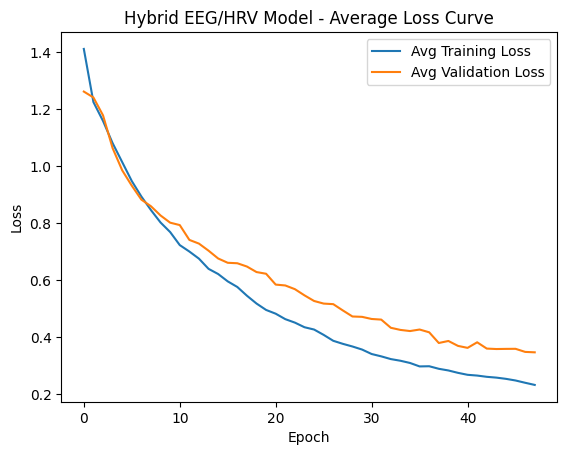

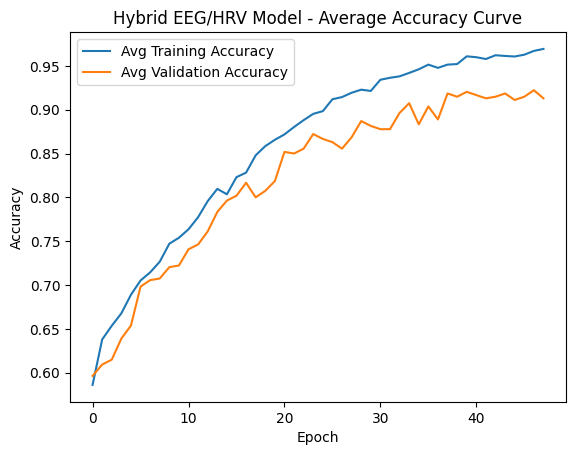

In [ ]:
import matplotlib.pyplot as plt

# Plot average loss
plt.figure()
plt.plot(avg_train_loss_hybrid, label='Avg Training Loss')
plt.plot(avg_val_loss_hybrid, label='Avg Validation Loss')
plt.title('Hybrid EEG/HRV Model - Average Loss Curve')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot average accuracy
plt.figure()
plt.plot(avg_train_acc_hybrid, label='Avg Training Accuracy')
plt.plot(avg_val_acc_hybrid, label='Avg Validation Accuracy')
plt.title('Hybrid EEG/HRV Model - Average Accuracy Curve')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [ ]:
# Print final summary
print(f"Average Validation Accuracy: {np.mean(avg_train_acc_hybrid[-10:]) * 100:.2f}%")
print(f"Standard Validation Accuracy Deviation (last 10 epochs): {np.std(avg_train_acc_hybrid[-10:]) * 100:.2f}%")

print(f"Average Validation Accuracy: {np.mean(avg_val_acc_hybrid[-10:]) * 100:.2f}%")
print(f"Standard Validation Accuracy Deviation (last 10 epochs): {np.std(avg_val_acc_hybrid[-10:]) * 100:.2f}%")

Average Validation Accuracy: 96.14%
Standard Validation Accuracy Deviation (last 10 epochs): 0.45%
Average Validation Accuracy: 91.59%
Standard Validation Accuracy Deviation (last 10 epochs): 0.33%


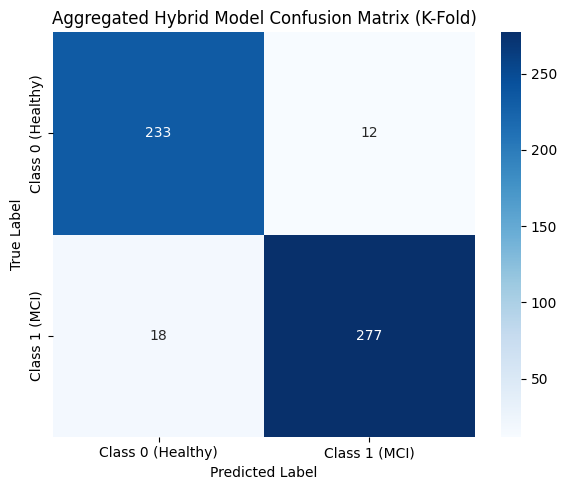

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Confusion matrix
cm_hybrid = confusion_matrix(all_y_true_hybrid, all_y_pred_hybrid)

# Labels
labels = ['Class 0 (Healthy)', 'Class 1 (MCI)']

# Plot
plt.figure(figsize=(6, 5))
sns.heatmap(cm_hybrid, annot=True, fmt='d', cmap='Blues',
            xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Aggregated Hybrid Model Confusion Matrix (K-Fold)')
plt.tight_layout()
plt.show()

In [ ]:
# Try classification report again
from sklearn.metrics import classification_report
print(classification_report(all_y_true_hybrid, all_y_pred_hybrid, target_names=["Healthy", "MCI"]))

              precision    recall  f1-score   support

     Healthy       0.93      0.95      0.94       245
         MCI       0.96      0.94      0.95       295

    accuracy                           0.94       540
   macro avg       0.94      0.95      0.94       540
weighted avg       0.94      0.94      0.94       540



### EEG

In [ ]:
from sklearn.model_selection import StratifiedKFold
from keras.models import Model
from keras.layers import Input, Conv1D, MaxPooling1D, LSTM, Flatten, Dense, Dropout, BatchNormalization
from keras.optimizers import Adam
from keras.regularizers import l2
from keras.callbacks import ReduceLROnPlateau, EarlyStopping
from keras import backend as K
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Parameters
n_splits = 10
l2_reg = 0.001

# Storage
all_train_acc_eeg, all_val_acc_eeg = [], []
all_train_loss_eeg, all_val_loss_eeg = [], []
all_y_true_eeg, all_y_pred_eeg = [], []

skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
fold_no = 1

for train_idx, test_idx in skf.split(np.zeros(len(Y_train)), Y_train):
    print(f"\n--- Training Fold {fold_no} ---")

    eeg_train = X_train_eeg_transformed[train_idx]
    eeg_test = X_train_eeg_transformed[test_idx]
    y_train_fold = Y_train[train_idx]
    y_test_fold = Y_train[test_idx]

    # Model architecture (same as hybrid's EEG branch)
    input_eeg = Input(shape=(X_train_eeg_transformed.shape[1], 1))
    eeg_branch = Conv1D(filters=32, kernel_size=2, activation='relu', kernel_regularizer=l2(l2_reg))(input_eeg)
    eeg_branch = BatchNormalization()(eeg_branch)
    eeg_branch = MaxPooling1D(pool_size=2)(eeg_branch)
    eeg_branch = Conv1D(filters=32, kernel_size=2, activation='relu', kernel_regularizer=l2(l2_reg))(eeg_branch)
    eeg_branch = MaxPooling1D(pool_size=2)(eeg_branch)
    eeg_branch = LSTM(32, return_sequences=True, dropout=0.1, recurrent_dropout=0.2, kernel_regularizer=l2(l2_reg))(eeg_branch)
    eeg_branch = Flatten()(eeg_branch)
    eeg_branch = Dropout(0.3)(eeg_branch)

    output = Dense(1, activation='sigmoid')(eeg_branch)
    model_eeg_kfold = Model(inputs=input_eeg, outputs=output)

    # Compile
    optimizer = Adam(learning_rate=1e-3, clipvalue=1.0)
    model_eeg_kfold.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])

    # Callbacks
    early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
    lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-5)

    # Train
    history = model_eeg_kfold.fit(
        eeg_train, y_train_fold,
        validation_data=(eeg_test, y_test_fold),
        epochs=100,
        batch_size=36,
        verbose=1,
        callbacks=[early_stopping, lr_scheduler]
    )

    # Store metrics
    all_train_acc_eeg.append(history.history['accuracy'])
    all_val_acc_eeg.append(history.history['val_accuracy'])
    all_train_loss_eeg.append(history.history['loss'])
    all_val_loss_eeg.append(history.history['val_loss'])

    # Predict
    preds = (model_eeg_kfold.predict(eeg_test) > 0.5).astype(int)
    all_y_pred_eeg.extend(preds.flatten())
    all_y_true_eeg.extend(y_test_fold)

    fold_no += 1
    K.clear_session()


--- Training Fold 1 ---
Epoch 1/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 6s 130ms/step - accuracy: 0.4910 - loss: 0.8014 - val_accuracy: 0.6296 - val_loss: 0.7530 - learning_rate: 0.0010
Epoch 2/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step - accuracy: 0.5409 - loss: 0.7647 - val_accuracy: 0.6481 - val_loss: 0.7510 - learning_rate: 0.0010
Epoch 3/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - accuracy: 0.6348 - loss: 0.7217 - val_accuracy: 0.6296 - val_loss: 0.7346 - learning_rate: 0.0010
Epoch 4/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - accuracy: 0.6916 - loss: 0.7006 - val_accuracy: 0.5556 - val_loss: 0.7564 - learning_rate: 0.0010
Epoch 5/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - accuracy: 0.7002 - loss: 0.6657 - val_accuracy: 0.7037 - val_loss: 0.7248 - learning_rate: 0.0010
Epoch 6/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 79ms/step - accuracy: 0.7166 - loss: 0.6590 - val_accuracy: 0.7222 - val_loss: 0.7138 - learning_rate: 0.0010
Epoch 7/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 80ms/step - accuracy

In [ ]:
# Compute mean curves
min_len_eeg = min(len(hist) for hist in all_train_acc_eeg)
avg_train_acc_eeg = np.mean([a[:min_len_eeg] for a in all_train_acc_eeg], axis=0)
avg_val_acc_eeg = np.mean([a[:min_len_eeg] for a in all_val_acc_eeg], axis=0)
avg_train_loss_eeg = np.mean([a[:min_len_eeg] for a in all_train_loss_eeg], axis=0)
avg_val_loss_eeg = np.mean([a[:min_len_eeg] for a in all_val_loss_eeg], axis=0)

In [ ]:
# Print final summary
print(f"Average Validation Accuracy: {np.mean(avg_train_acc_eeg[-10:]) * 100:.2f}%")
print(f"Standard Validation Accuracy Deviation (last 10 epochs): {np.std(avg_train_acc_eeg[-10:]) * 100:.2f}%")

print(f"Average Validation Accuracy: {np.mean(avg_val_acc_eeg[-10:]) * 100:.2f}%")
print(f"Standard Validation Accuracy Deviation (last 10 epochs): {np.std(avg_val_acc_eeg[-10:]) * 100:.2f}%")

Average Validation Accuracy: 84.31%
Standard Validation Accuracy Deviation (last 10 epochs): 1.58%
Average Validation Accuracy: 76.50%
Standard Validation Accuracy Deviation (last 10 epochs): 1.43%


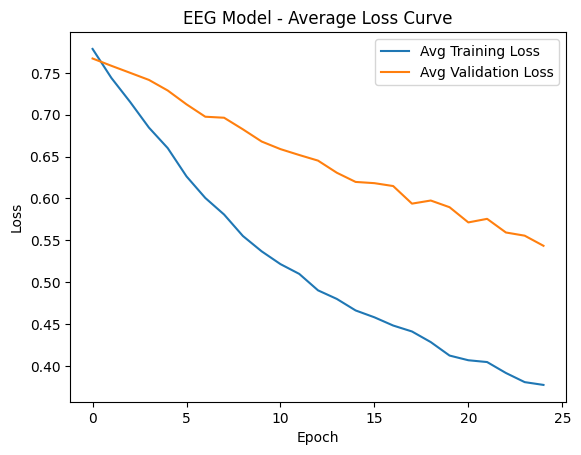

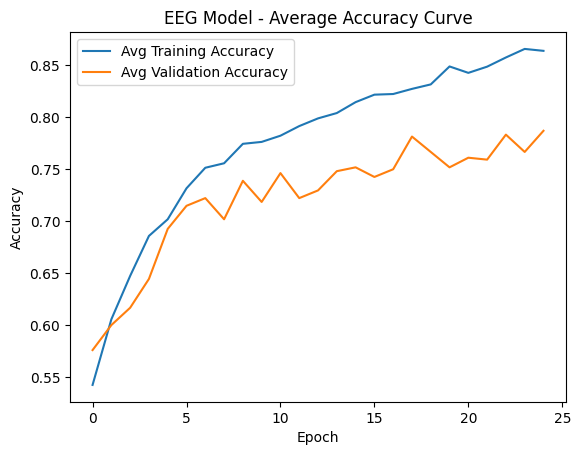

In [ ]:
# Plot average loss
plt.figure()
plt.plot(avg_train_loss_eeg, label='Avg Training Loss')
plt.plot(avg_val_loss_eeg, label='Avg Validation Loss')
plt.title('EEG Model - Average Loss Curve')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot average accuracy
plt.figure()
plt.plot(avg_train_acc_eeg, label='Avg Training Accuracy')
plt.plot(avg_val_acc_eeg, label='Avg Validation Accuracy')
plt.title('EEG Model - Average Accuracy Curve')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

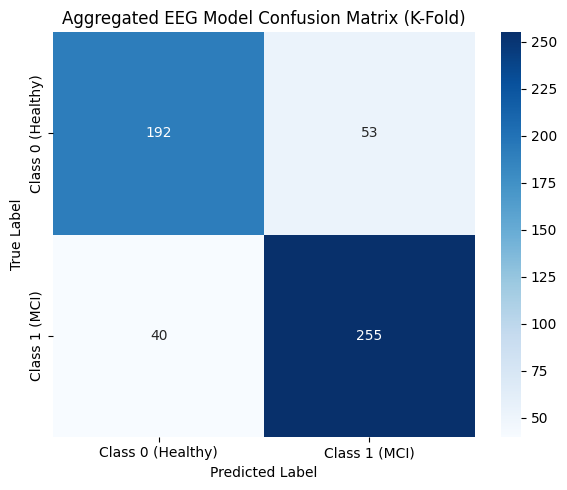

In [ ]:
cm_eeg = confusion_matrix(all_y_true_eeg, all_y_pred_eeg)

# Labels
labels = ['Class 0 (Healthy)', 'Class 1 (MCI)']

# Plot
plt.figure(figsize=(6, 5))
sns.heatmap(cm_eeg, annot=True, fmt='d', cmap='Blues',
            xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Aggregated EEG Model Confusion Matrix (K-Fold)')
plt.tight_layout()
plt.show()

In [ ]:
# Try classification report again
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(all_y_true_eeg, all_y_pred_eeg, target_names=["Healthy", "MCI"]))

              precision    recall  f1-score   support

     Healthy       0.83      0.78      0.81       245
         MCI       0.83      0.86      0.85       295

    accuracy                           0.83       540
   macro avg       0.83      0.82      0.83       540
weighted avg       0.83      0.83      0.83       540



### HRV

In [ ]:
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import confusion_matrix, classification_report
from keras.layers import Input, Dense, Dropout, LSTM, Flatten
from keras.models import Model
from keras.regularizers import l2
from keras.optimizers import Adam
from keras.callbacks import ReduceLROnPlateau, EarlyStopping
from keras import backend as K
import numpy as np

# Parameters
n_splits = 10
l2_reg = 0.001

# Storage
all_train_acc_hrv, all_val_acc_hrv = [], []
all_train_loss_hrv, all_val_loss_hrv = [], []
all_y_true_hrv, all_y_pred_hrv = [], []

skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
fold_no = 1

for train, test in skf.split(np.zeros(len(Y_train)), Y_train):
    print('------------------------------------------------------------------------')
    print(f'Training for fold {fold_no} ...')

    # Fold data
    X_hrv_train, X_hrv_val = X_train_hrv_reshaped[train], X_train_hrv_reshaped[test]
    y_train_fold, y_test_fold = Y_train[train], Y_train[test]

    # Model architecture
    input_hrv = Input(shape=(1, X_train_hrv_reshaped.shape[2]))
    hrv_branch = LSTM(32, dropout=0.1, recurrent_dropout=0.2, kernel_regularizer=l2(l2_reg))(input_hrv)
    hrv_branch = Dense(64, activation='relu', kernel_regularizer=l2(l2_reg))(hrv_branch)
    hrv_branch = Dropout(0.1)(hrv_branch)
    output = Dense(1, activation='sigmoid')(hrv_branch)

    model_hrv_kfold = Model(inputs=input_hrv, outputs=output)
    model_hrv_kfold.compile(optimizer=Adam(learning_rate=1e-3), loss='binary_crossentropy', metrics=['accuracy'])

    # Callbacks
    lr_scheduler = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=10)
    early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

    # Fit
    history = model_hrv_kfold.fit(
        X_hrv_train, y_train_fold,
        batch_size=36,
        epochs=100,
        verbose=1,
        validation_data=(X_hrv_val, y_test_fold),
        callbacks=[early_stopping, lr_scheduler]
    )

    # Store metrics
    all_train_acc_hrv.append(history.history['accuracy'])
    all_val_acc_hrv.append(history.history['val_accuracy'])
    all_train_loss_hrv.append(history.history['loss'])
    all_val_loss_hrv.append(history.history['val_loss'])

    # Predictions
    preds = (model_hrv_kfold.predict(X_hrv_val) > 0.5).astype(int)
    all_y_pred_hrv.extend(preds.flatten())
    all_y_true_hrv.extend(y_test_fold)

    fold_no += 1
    K.clear_session()

------------------------------------------------------------------------
Training for fold 1 ...
Epoch 1/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - accuracy: 0.4800 - loss: 0.7499 - val_accuracy: 0.5556 - val_loss: 0.7322 - learning_rate: 0.0010
Epoch 2/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.5308 - loss: 0.7285 - val_accuracy: 0.5000 - val_loss: 0.7150 - learning_rate: 0.0010
Epoch 3/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - accuracy: 0.5843 - loss: 0.7106 - val_accuracy: 0.5370 - val_loss: 0.6989 - learning_rate: 0.0010
Epoch 4/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6205 - loss: 0.6753 - val_accuracy: 0.5370 - val_loss: 0.6857 - learning_rate: 0.0010
Epoch 5/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6157 - loss: 0.6693 - val_accuracy: 0.5741 - val_loss: 0.6760 - learning_rate: 0.0010
Epoch 6/100
14/14 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - accuracy: 0.6278 - loss: 0.6562 - val_accuracy: 0.5741 - val_loss: 0.6678 - learning_rate: 0.0

In [ ]:
# Compute mean curves
min_len_hrv = min(len(hist) for hist in all_train_acc_hrv)
avg_train_acc_hrv = np.mean([a[:min_len_hrv] for a in all_train_acc_hrv], axis=0)
avg_val_acc_hrv = np.mean([a[:min_len_hrv] for a in all_val_acc_hrv], axis=0)
avg_train_loss_hrv = np.mean([a[:min_len_hrv] for a in all_train_loss_hrv], axis=0)
avg_val_loss_hrv = np.mean([a[:min_len_hrv] for a in all_val_loss_hrv], axis=0)

In [ ]:
# Print final summary
print(f"Average Training Accuracy: {np.mean(avg_train_acc_hrv[-10:]) * 100:.2f}%")
print(f"Standard Validation Accuracy Deviation (last 10 epochs): {np.std(avg_train_acc_hrv[-10:]) * 100:.2f}%")

print(f"Average Training Accuracy: {np.mean(avg_val_acc_hrv[-10:]) * 100:.2f}%")
print(f"Standard Validation Accuracy Deviation (last 10 epochs): {np.std(avg_val_acc_hrv[-10:]) * 100:.2f}%")

Average Validation Accuracy: 64.56%
Standard Validation Accuracy Deviation (last 10 epochs): 0.18%
Average Validation Accuracy: 64.09%
Standard Validation Accuracy Deviation (last 10 epochs): 0.31%


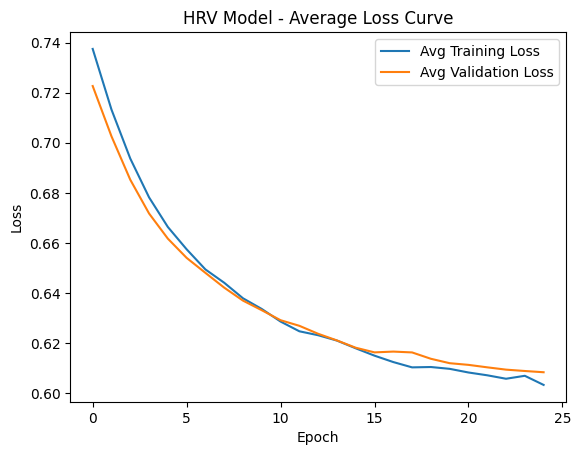

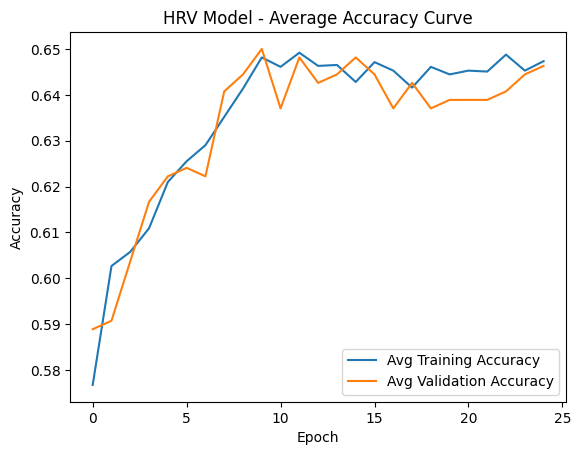

In [ ]:
# Plot average loss
plt.figure()
plt.plot(avg_train_loss_hrv, label='Avg Training Loss')
plt.plot(avg_val_loss_hrv, label='Avg Validation Loss')
plt.title('HRV Model - Average Loss Curve')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot average accuracy
plt.figure()
plt.plot(avg_train_acc_hrv, label='Avg Training Accuracy')
plt.plot(avg_val_acc_hrv, label='Avg Validation Accuracy')
plt.title('HRV Model - Average Accuracy Curve')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

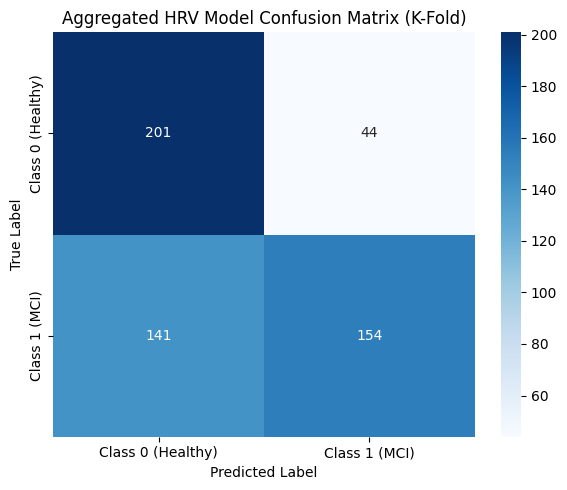

In [ ]:
cm_hrv = confusion_matrix(all_y_true_hrv, all_y_pred_hrv)

# Labels
labels = ['Class 0 (Healthy)', 'Class 1 (MCI)']

# Plot
plt.figure(figsize=(6, 5))
sns.heatmap(cm_hrv, annot=True, fmt='d', cmap='Blues',
            xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Aggregated HRV Model Confusion Matrix (K-Fold)')
plt.tight_layout()
plt.show()

In [ ]:
# Try classification report again
from sklearn.metrics import classification_report, confusion_matrix
print(classification_report(all_y_true_hrv, all_y_pred_hrv, target_names=["Healthy", "MCI"]))

              precision    recall  f1-score   support

     Healthy       0.59      0.83      0.69       245
         MCI       0.79      0.53      0.63       295

    accuracy                           0.66       540
   macro avg       0.69      0.68      0.66       540
weighted avg       0.70      0.66      0.66       540

